## Collecting Face Images from Videos

In this notebook, I walk you through the process of collecting your own face data by extracting them from videos. I use the video for *Let It Go* from Disney's *Frozen* because I plan to use this data in another project and more importantly because it is one of the greatest songs of all time.

In [1]:
!pip3 install face_recognition

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import face_recognition 

In another notebook, I'll walk you through how to create your own face-detector using convolutional neural networks but for this tutorial I will use the python3 library, *face_recognition*.

First, let's simply extract the frames from the video using *cv2* and store them in the list, *frames*.

In [3]:
from IPython.display import clear_output

video = cv2.VideoCapture('/content/let_it_go.mp4')

frames = []
success = 1
frame_count = 0

while success:
  success, frame = video.read()
  if success:
    frame_count+=1
    frames.append(frame)
    clear_output(wait=True)
    print('Extracted', frame_count, 'frames in total.')

Extracted 5248 frames in total.


In [4]:
video.release()

We have 5248 frames from a video 3 mins and 38 seconds long (approximately) playing at 60 fps so the math works out.

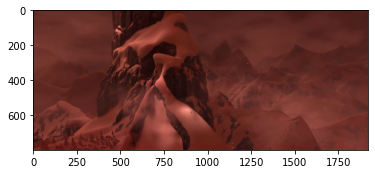

In [5]:
plt.imshow(frames[100])

Here is a frame from the video. Notice that *cv2* reads images as BRG instead of RGB. This can easily be fixed as follows.

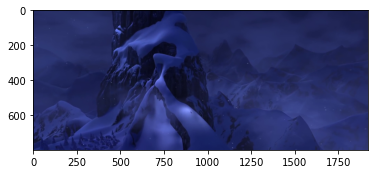

In [6]:
corrected_frame = cv2.cvtColor(frames[100], cv2.COLOR_BGR2RGB)
plt.imshow(corrected_frame)

Next we collect every face that is detected in the video.

Extracted 1 faces from 5248 frames.


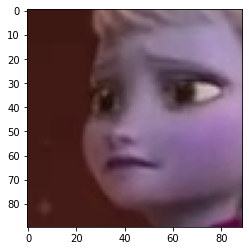

In [9]:
faces = []
frame_count = 0
face_count = 0

for frame in frames:
  frame_count+=1
  face_locations = face_recognition.face_locations(frame)
  for face_location in face_locations:
    top, right, bottom, left = face_location
    face = frame[top:bottom, left:right]
    faces.append(face)
    face_count=+1
  clear_output(wait=True)
  print('Extracted', face_count, 'faces from', frame_count, 'frames.')

plt.imshow(faces[100])

Depending on your hardware and the video you choose, collecting the faces could take a significant amount of time so make sure you can distract yourself.

For my purposes, I need the face images to be grayscale and have dimensions 150x150. (I will be using them to train a convolutional neural network.) 

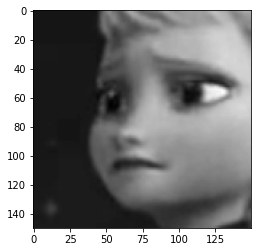

In [12]:
scaled_faces = []

for face in faces:
  scaled_face = cv2.resize(face,(150,150))
  scaled_face = cv2.cvtColor(scaled_face, cv2.COLOR_BGR2GRAY)
  scaled_faces.append(scaled_face)

plt.imshow(scaled_faces[100], cmap ='gray')

In [14]:
np.sqrt(len(scaled_faces))

35.14256678161116

Let's put all our faces in a 35x35 image collage to get a better view of what we have. *cv2.imshow* causes jupyter to crash so we'll use this Colab patch instead.

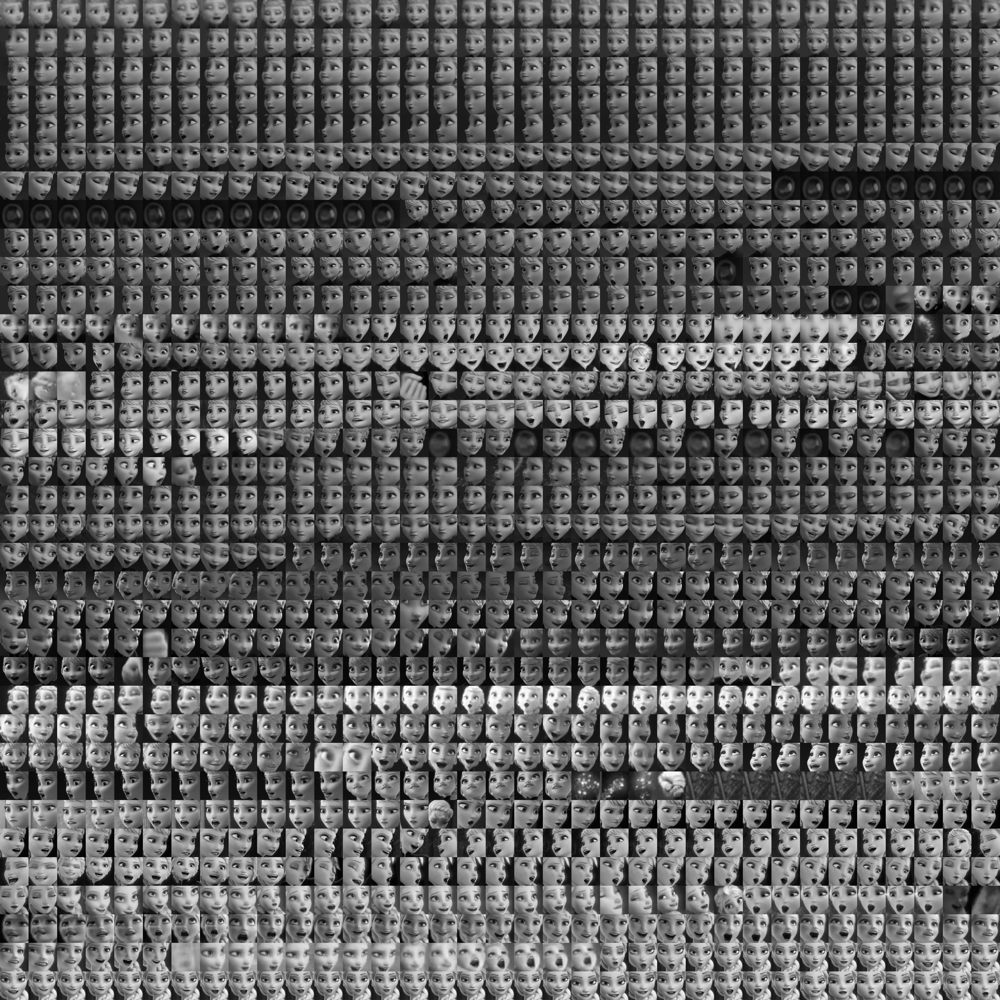

In [16]:
from google.colab.patches import cv2_imshow

horizontal_stacks = []
for i in range(35):
  horizontal= np.hstack(scaled_faces[i*35:(i+1)*35])
  horizontal_stacks.append(horizontal)
collage= np.vstack(horizontal_stacks)

cv2_imshow(collage)

Now finally, let's store the images so that we could use them later.

In [18]:
os.mkdir('/content/letitgo')

count = 1

for face in scaled_faces:
  cv2.imwrite('/content/letitgo/face_' + str(count) + '.jpg', face)
  count+=1

In case you are also using Colab, you can download a zipfile containing the directory we just stored the images in with the following code.

In [19]:
!zip -r /content/letitgo.zip /content/letitgo

from google.colab import files
files.download('/content/letitgo.zip')

  adding: content/letitgo/ (stored 0%)
  adding: content/letitgo/face_477.jpg (stored 0%)
  adding: content/letitgo/face_1097.jpg (stored 0%)
  adding: content/letitgo/face_440.jpg (stored 0%)
  adding: content/letitgo/face_1126.jpg (stored 0%)
  adding: content/letitgo/face_618.jpg (stored 0%)
  adding: content/letitgo/face_367.jpg (stored 0%)
  adding: content/letitgo/face_886.jpg (stored 0%)
  adding: content/letitgo/face_1158.jpg (stored 0%)
  adding: content/letitgo/face_1169.jpg (stored 0%)
  adding: content/letitgo/face_461.jpg (stored 0%)
  adding: content/letitgo/face_465.jpg (stored 0%)
  adding: content/letitgo/face_324.jpg (stored 0%)
  adding: content/letitgo/face_977.jpg (stored 0%)
  adding: content/letitgo/face_412.jpg (stored 0%)
  adding: content/letitgo/face_813.jpg (stored 0%)
  adding: content/letitgo/face_599.jpg (stored 0%)
  adding: content/letitgo/face_1155.jpg (stored 0%)
  adding: content/letitgo/face_799.jpg (stored 0%)
  adding: content/letitgo/face_483.jpg

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

This notebook was for demonstrative purposes. For my own personal use, I have written the entire process in one concise script which is viewable on my github and you can feel free to use it. My goal was to allow you to have more freedom with what you do with the images. This isn't anything new but I enjoy sharing and hopefully it can help someone out there.

If you rather just copy/paste the function, I will include it below.

In [22]:
def vidtofaces(video_file):
  video = cv2.VideoCapture(video_file)

  faces = []
  success = 1
  frame_count = 0
  face_count = 0

  while success:
    success, frame = video.read()
    if success:
      frame_count+=1
      face_locations = face_recognition.face_locations(frame)
      for face_location in face_locations:
        top, right, bottom, left = face_location
        face = frame[top:bottom, left:right]
        face = cv2.resize(face,(150,150))
        face = cv2.cvtColor(face, cv2.COLOR_BGR2GRAY)
        faces.append(face)
        face_count+=1
      clear_output(wait=True)
      print('Extracted', face_count, 'faces from', frame_count, 'frames.')

  video.release()

  return faces

We can test it on a smaller video.

In [23]:
faces = vidtofaces('/content/test_480p.mp4')

Extracted 480 faces from 870 frames.


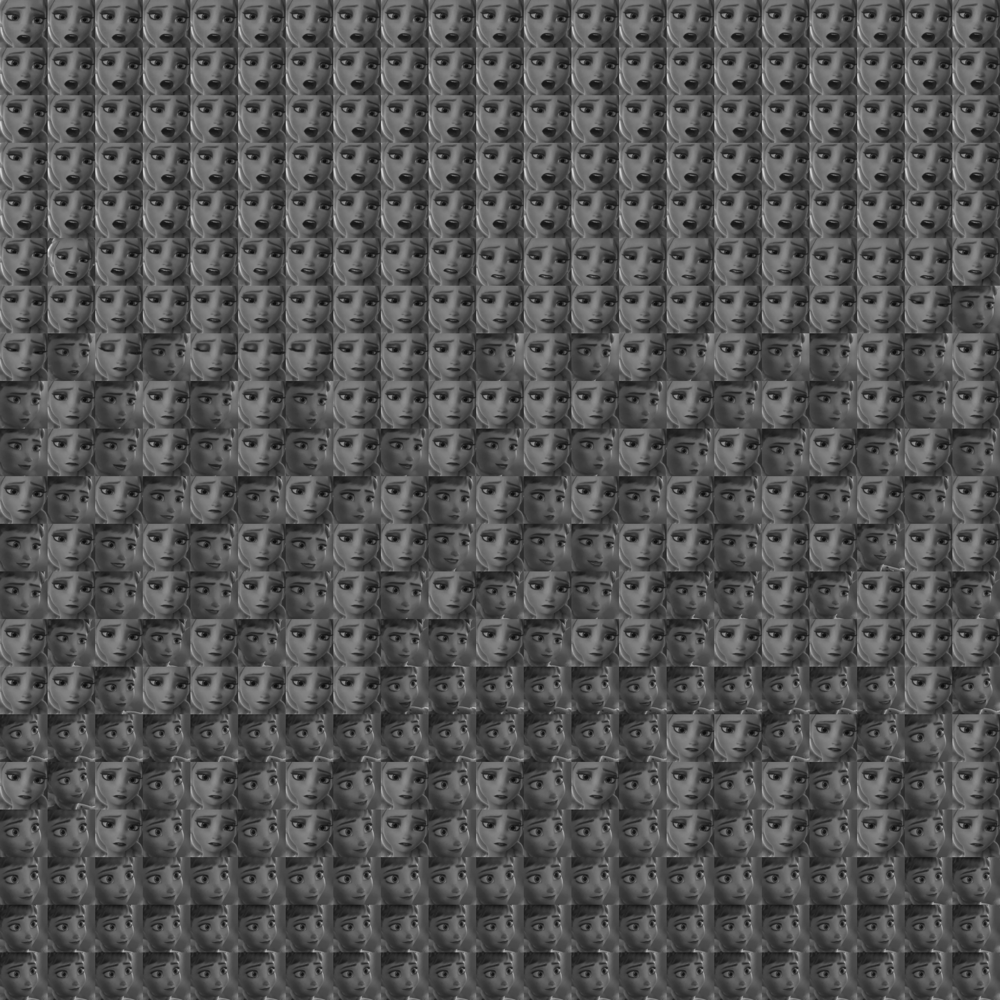

In [25]:
horizontal_stacks = []
for i in range(21):
  horizontal= np.hstack(faces[i*21:(i+1)*21])
  horizontal_stacks.append(horizontal)
collage2= np.vstack(horizontal_stacks)

cv2_imshow(collage2)